# Гомография

Задание:
1. Сделать панораму для более чем 2-х снимков.

**Гомография** — это преобразование (матрица **$3 \times 3$**), которое отображает точки одного изображения в точки соответсвия другого изображения. Записать матрицу гомографии можно следующим образом:

$$
H = \left(\matrix{h_{00} & h_{01} & h_{02}
              \cr h_{10} & h_{11} & h_{12}
              \cr h_{20} & h_{21} & h_{22} } \right)
$$

Рассмотрим первый набор соответствующих точек — **$(x_1, y_1)$** в первом изображении и **$(x_2, y_2)$** во втором. Далее гомография **$H$** отображает их следующим образом:

$$
 \left(\matrix{x_1 \cr y_1 \cr 1  } \right)
 = H \times \left(\matrix{x_2 \cr y_2 \cr 1  } \right)
 = \left(\matrix{h_{00} & h_{01} & h_{02}
              \cr h_{10} & h_{11} & h_{12}
              \cr h_{20} & h_{21} & h_{22} } \right) \times
    \left(\matrix{x_2 \cr y_2 \cr 1  } \right)
$$

## Панорама

In [21]:
import os
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

In [22]:
def homography(img1, img2):

  # Преобразование изображений в оттенки серого
  gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
  gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

  # Инициализация объекта SIFT (определение ключевых точек)
  sift = cv2.xfeatures2d.SIFT_create()

  # Нахождение ключевых точек и дескрипторов на обоих изображениях
  kp1, des1 = sift.detectAndCompute(gray1, None)
  kp2, des2 = sift.detectAndCompute(gray2, None)

  # Нахождение соответствий между дескрипторами на двух изображениях
  matcher = cv2.DescriptorMatcher_create(cv2.DescriptorMatcher_FLANNBASED)
  matches = matcher.knnMatch(des1, des2, k=2)

  # Фильтрация соответствий с помощью метрики Lowe's ratio test
  good_matches = []
  for m, n in matches:
      if m.distance < 0.75 * n.distance:
          good_matches.append(m)

  # Нахождение матрицы гомографии
  src_pts = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
  dst_pts = np.float32([kp2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)
  H, _ = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

  return H

In [23]:
def generate_panorama(img1, img2):
  h = homography(img1, img2)
  # Преобразование изображений
  panorama = cv2.warpPerspective(img1, h, (img1.shape[1] + img2.shape[1], img2.shape[0]))
  panorama[0:img2.shape[0], 0:img2.shape[1]] = img2

  return panorama

In [24]:
# Загрузка изображений
included_extensions = ['jpg', 'jpeg', 'png']

imgs_names = [img_name for img_name in os.listdir('data/')
             if any(img_name.endswith(ext) for ext in included_extensions)]

imgs_names.sort()

imgs_path = [('data/' + img) for img in imgs_names]

imgs = [cv2.imread(i) for i in imgs_path]

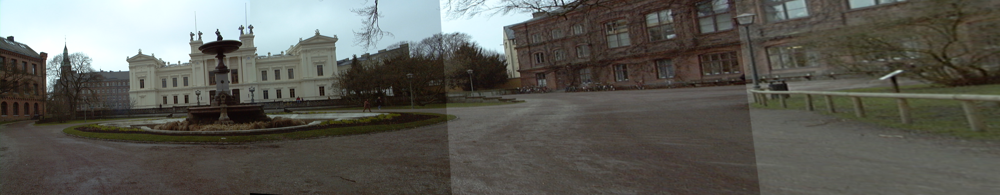

In [26]:
# Создание панорамы
for i in range(1, len(imgs)-1):
  if i == 1:
    panorama = generate_panorama(imgs[i-1], imgs[i])
  else:
    panorama = generate_panorama(panorama, imgs[i])

# Отображение результата
cv2_imshow(panorama)

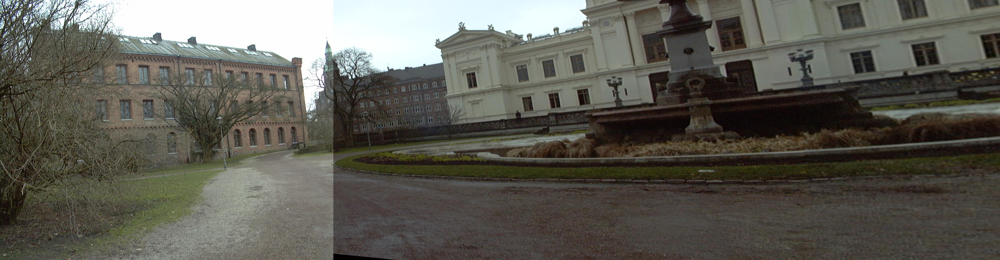

In [27]:
# Создание панорамы
for i in range(3, len(imgs)):
  if i == 3:
    panorama = generate_panorama(imgs[i-1], imgs[i])
  else:
    panorama = generate_panorama(panorama, imgs[i])

# Отображение результата
cv2_imshow(panorama)